# **DNN Progetto CERN**

## Importa le librerie Python

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from torch.utils.data import TensorDataset, DataLoader, WeightedRandomSampler
from torch import optim
import time
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
!pip install umap-learn
import umap
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import plotly.express as px
import hdbscan
import random
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from torchsummary import summary
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, roc_auc_score, average_precision_score
!pip install shap
import shap

## Download dei dati e costruzione del dataset

In [ ]:
# monta Google Drive
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
directory = "/content/gdrive/My Drive/Colab Notebooks/Progetto CERN/Dati"

# list of all .h5 files in the folder
h5_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.h5')]
print(f"Found {len(h5_files)} signal files")

# reads all signal files and creates the related dataset
df_list = []
count = 0
for f in h5_files:
    #print(f"Loading {f}")
    df = pd.read_hdf(f, key='Events')
    df_list.append(df)
    count += len(df)
print(f"Found {count} a total of events\n")

# concatenates all files to create one dataset
full_df = pd.concat(df_list, ignore_index=True)
print(f"Total dimension of dataset: {full_df.shape}")

Found 1 signal files
Found 85752 a total of events

Total dimension of dataset: (85752, 22)


In [ ]:
#creo una lista con le feature (escludendo la label e il GenWeight)
columns = list(df.columns)
sel_features = columns[:-2]
print("Columns in the dataframe:")
print(sel_features)

features_with_gen = columns[:-1]
print("\nColumns in the dataframe with GenWeight:")
print(features_with_gen)

Columns in the dataframe:
['Dimuon_mass', 'Sigma_Dimuon_mass', 'Dimuon_pt', 'Dimuon_y', 'phi_CS', 'cos_theta_CS', 'Jet_pt_1', 'Jet_pt_2', 'Jet_eta_1', 'Jet_eta_2', 'Jet_phi_1', 'Jet_phi_2', 'jj_m', 'Jet_DeltaEta', 'min_j_dimuon_DeltaEta', 'Zeppenfield', 'pt_balance_ratio', 'Jet_QGL_1', 'Jet_QGL_2', 'nn_score']

Columns in the dataframe with GenWeight:
['Dimuon_mass', 'Sigma_Dimuon_mass', 'Dimuon_pt', 'Dimuon_y', 'phi_CS', 'cos_theta_CS', 'Jet_pt_1', 'Jet_pt_2', 'Jet_eta_1', 'Jet_eta_2', 'Jet_phi_1', 'Jet_phi_2', 'jj_m', 'Jet_DeltaEta', 'min_j_dimuon_DeltaEta', 'Zeppenfield', 'pt_balance_ratio', 'Jet_QGL_1', 'Jet_QGL_2', 'nn_score', 'GenWeight']


In [ ]:
# prints the header of the dataframe
full_df

,Dimuon_mass,Sigma_Dimuon_mass,Dimuon_pt,Dimuon_y,phi_CS,cos_theta_CS,Jet_pt_1,Jet_pt_2,Jet_eta_1,Jet_eta_2,...,jj_m,Jet_DeltaEta,min_j_dimuon_DeltaEta,Zeppenfield,pt_balance_ratio,Jet_QGL_1,Jet_QGL_2,nn_score,GenWeight,label
0,110.642990,1.686530,32.254635,-1.362208,2.252721,-0.298711,79.12500,57.781250,-1.608398,2.825195,...,627.693604,4.433594,0.965238,0.191715,0.295025,0.152588,0.332764,0.154890,-211.929688,0
1,121.650279,2.644217,299.362025,-1.581064,2.010855,-0.531492,301.50000,53.375000,1.224609,-4.390625,...,2104.810791,5.615234,2.738949,-0.782057,0.011464,0.822266,0.394775,0.997974,4.184326,1
2,106.442927,2.386405,36.137342,2.005814,1.801714,0.220703,84.06250,27.687500,-1.426514,2.267578,...,314.017731,3.694092,0.856727,1.048781,0.155827,0.190796,0.232056,0.423382,-211.929688,0
3,123.086672,1.460018,26.452559,-0.248982,1.629137,-0.613761,61.90625,53.468750,3.081055,0.603638,...,201.692566,2.477417,1.617864,-0.600374,0.506246,0.546875,0.560547,0.129660,211.929688,0
4,125.002808,1.176273,45.448332,-0.085838,2.611659,-0.676416,76.75000,24.421875,3.105957,-2.381348,...,675.561829,5.487305,2.132406,-0.515673,0.072699,0.398438,0.489990,0.989408,4.184326,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85747,123.097551,2.227192,201.272784,1.375229,2.420898,0.169664,143.50000,81.187500,-1.108887,3.261719,...,953.122314,4.370605,1.744357,0.815053,0.005045,0.676758,0.521484,0.996552,4.184326,1
85748,109.401020,1.413488,79.271724,0.390208,-3.137821,0.709592,47.37500,47.343750,-3.088867,0.533569,...,287.385376,3.622437,0.104317,0.608079,0.025523,0.395020,0.141479,0.486021,-211.929688,0
85749,124.828871,1.274682,108.712107,0.114704,-1.955551,0.559164,133.12500,68.187500,-3.128906,-0.515747,...,368.784332,2.613159,0.689904,0.543956,0.172718,0.193726,0.136841,0.023943,211.929688,0
85750,158.102269,2.056630,52.922135,0.586577,2.545475,0.849260,45.12500,40.406250,-4.078125,-1.100586,...,187.074249,2.977539,2.524254,0.697135,0.257606,0.300781,0.166992,0.009758,211.929688,0


In [ ]:
# calcola la matrice di correlazione
corr_matrix = full_df[sel_features].corr()
corr_matrix

,Dimuon_mass,Sigma_Dimuon_mass,Dimuon_pt,Dimuon_y,phi_CS,cos_theta_CS,Jet_pt_1,Jet_pt_2,Jet_eta_1,Jet_eta_2,Jet_phi_1,Jet_phi_2,jj_m,Jet_DeltaEta,min_j_dimuon_DeltaEta,Zeppenfield,pt_balance_ratio,Jet_QGL_1,Jet_QGL_2,nn_score
Dimuon_mass,1.000000,0.272969,0.152287,-0.002845,0.002601,-0.002127,0.110908,0.059231,0.005949,-0.006269,0.003139,-0.000155,0.113205,0.063850,0.080283,-0.001788,-0.151663,0.054177,0.040423,0.126203
Sigma_Dimuon_mass,0.272969,1.000000,0.220400,-0.005018,0.001195,-0.000447,0.147276,0.034426,0.006710,-0.007011,-0.002567,0.000340,-0.047520,-0.114854,-0.080182,0.002444,-0.016281,0.044175,-0.033497,-0.073011
Dimuon_pt,0.152287,0.220400,1.000000,-0.000646,-0.000750,-0.005053,0.638695,0.209931,0.007244,-0.010118,0.009692,-0.010342,0.300407,0.070720,0.133562,0.002179,-0.361627,0.198752,0.101605,0.302083
Dimuon_y,-0.002845,-0.005018,-0.000646,1.000000,0.001112,0.308983,0.002303,0.005672,-0.367421,0.389377,-0.000580,0.000409,-0.000362,-0.003730,-0.001483,0.112648,0.003235,-0.001967,-0.003490,-0.012121
phi_CS,0.002601,0.001195,-0.000750,0.001112,1.000000,-0.001547,-0.001817,0.006409,0.004607,-0.005532,-0.008694,0.003691,0.002992,0.004100,0.001528,0.000972,-0.001118,0.001650,0.003572,0.005466
cos_theta_CS,-0.002127,-0.000447,-0.005053,0.308983,-0.001547,1.000000,0.003614,0.003801,-0.310160,0.145702,0.004301,0.003995,-0.002915,-0.006056,-0.003978,0.061937,0.001745,-0.004364,-0.002970,-0.012760
Jet_pt_1,0.110908,0.147276,0.638695,0.002303,-0.001817,0.003614,1.000000,0.540295,0.004676,-0.008243,0.012208,-0.010307,0.321190,-0.034719,0.015111,0.000592,-0.296406,0.254866,0.137951,0.275386
Jet_pt_2,0.059231,0.034426,0.209931,0.005672,0.006409,0.003801,0.540295,1.000000,0.004138,-0.003430,0.006906,-0.012493,0.275894,-0.056468,-0.116786,-0.003446,-0.195035,0.134528,0.167471,0.204171
Jet_eta_1,0.005949,0.006710,0.007244,-0.367421,0.004607,-0.310160,0.004676,0.004138,1.000000,-0.688662,-0.005534,-0.006276,-0.002274,-0.006805,0.004539,-0.100855,-0.009060,0.004873,0.004057,0.013949
Jet_eta_2,-0.006269,-0.007011,-0.010118,0.389377,-0.005532,0.145702,-0.008243,-0.003430,-0.688662,1.000000,0.001666,0.002825,-0.003209,-0.001192,0.002470,0.074922,0.009080,-0.008281,0.003071,-0.004494


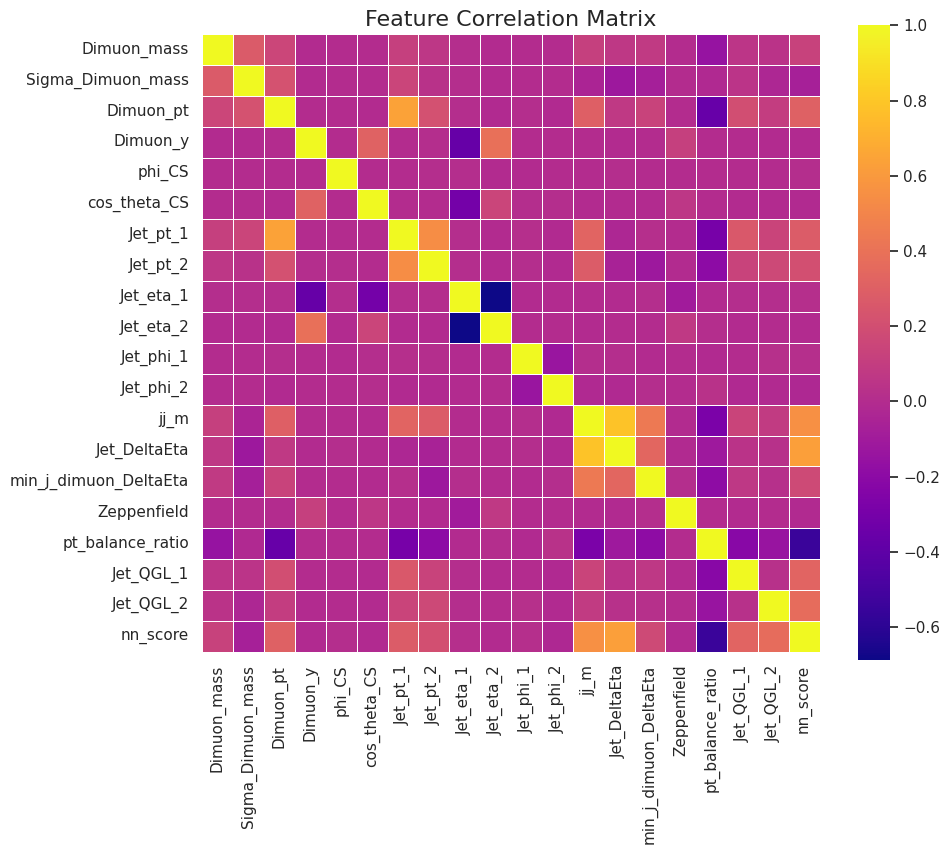

In [ ]:
# Imposta la dimensione della figura e la mappa colori
plt.figure(figsize=(10, 10))
sns.set(style="white")

# Heatmap con annotazioni e colori leggibili
sns.heatmap(corr_matrix, cmap="plasma", annot=False, fmt=".2f", square=True, linewidths=0.5, cbar_kws={"shrink": .75})

plt.title("Feature Correlation Matrix", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
df_shuffled = full_df.sample(frac=1, random_state=990).reset_index(drop=True)
df_shuffled

,Dimuon_mass,Sigma_Dimuon_mass,Dimuon_pt,Dimuon_y,phi_CS,cos_theta_CS,Jet_pt_1,Jet_pt_2,Jet_eta_1,Jet_eta_2,...,jj_m,Jet_DeltaEta,min_j_dimuon_DeltaEta,Zeppenfield,pt_balance_ratio,Jet_QGL_1,Jet_QGL_2,nn_score,GenWeight,label
0,106.970258,1.780684,56.833071,-1.700954,2.139118,-0.415156,65.18750,49.312500,2.648438,-1.173340,...,388.572266,3.821777,1.258245,-0.945551,0.050047,0.508789,0.139404,0.628817,211.929688,0
1,126.388185,1.581375,264.485286,0.451172,-1.899440,0.587047,300.00000,61.875000,-2.367188,3.496094,...,2561.889893,5.863281,2.863710,0.577192,0.010176,0.404053,0.605469,0.998393,4.184326,1
2,139.240940,1.124026,24.699278,0.333418,1.930161,-0.184762,205.12500,176.000000,0.635010,-1.968506,...,750.718079,2.603516,0.783542,-0.371509,0.021288,0.760742,0.092712,0.776170,-211.929688,0
3,101.489830,2.451215,23.842437,-1.827372,-3.116295,-0.579979,51.12500,39.937500,2.703613,-0.983521,...,292.295013,3.687134,2.294418,-0.997462,0.332132,0.360352,0.157715,0.050973,211.929688,0
4,126.027093,1.398117,80.110506,-0.170207,-2.830678,-0.770620,82.62500,30.265625,2.617676,-3.562012,...,1096.750000,6.179688,2.931325,-0.527601,0.170825,0.408203,0.595215,0.981113,4.184326,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85747,151.355503,2.988475,72.130033,1.392512,-1.745970,0.730284,101.18750,64.375000,-0.857666,0.543579,...,187.919754,1.401245,1.641441,1.498645,0.202698,0.820312,0.134644,0.023156,211.929688,0
85748,112.690590,2.519107,53.130110,-1.959493,-2.920296,-0.289028,41.96875,25.843750,-1.492920,1.968018,...,190.623810,3.460938,1.302513,-0.070832,0.229041,0.143677,0.156738,0.020988,-211.929688,0
85749,124.095628,1.467180,96.102013,0.888664,2.116865,-0.727757,113.50000,85.625000,-2.459473,3.024902,...,1533.480469,5.484375,1.749656,0.662649,0.103407,0.724121,0.306152,0.995710,4.184326,1
85750,135.619150,2.019171,72.911952,1.045249,-2.066943,0.818280,96.31250,89.625000,-1.067871,-4.104492,...,441.051544,3.036621,2.762986,-0.155732,0.010884,0.141846,0.508301,0.420128,211.929688,0


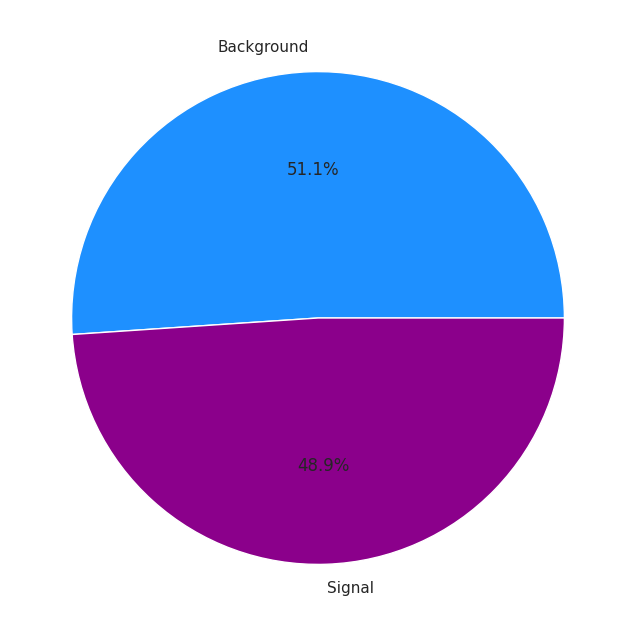

In [ ]:
# controllo che le classi siano bilanciate (cosa che già sappiamo che non è vera). Faccio un plot per vedere se le classi sono bilanciate
def pie_chart(y_all):
    # converte in Numpy Array una Series Pandas
    classes = np.array(y_all)
    # calcola la frazione di ciascuna classe
    arr_class_means = [np.mean(classes == i) for i in np.unique(classes)]
    # crea etichette per ciasciuna classe
    labels = ["Background", "Signal"]
    f, ax = plt.subplots(1, 1, figsize=(8, 8))
    colors = ["dodgerblue", "darkmagenta"]
    ax.pie(arr_class_means, labels=labels, autopct="%.1f%%", colors = colors)
    plt.show()

pie_chart(df_shuffled["label"])

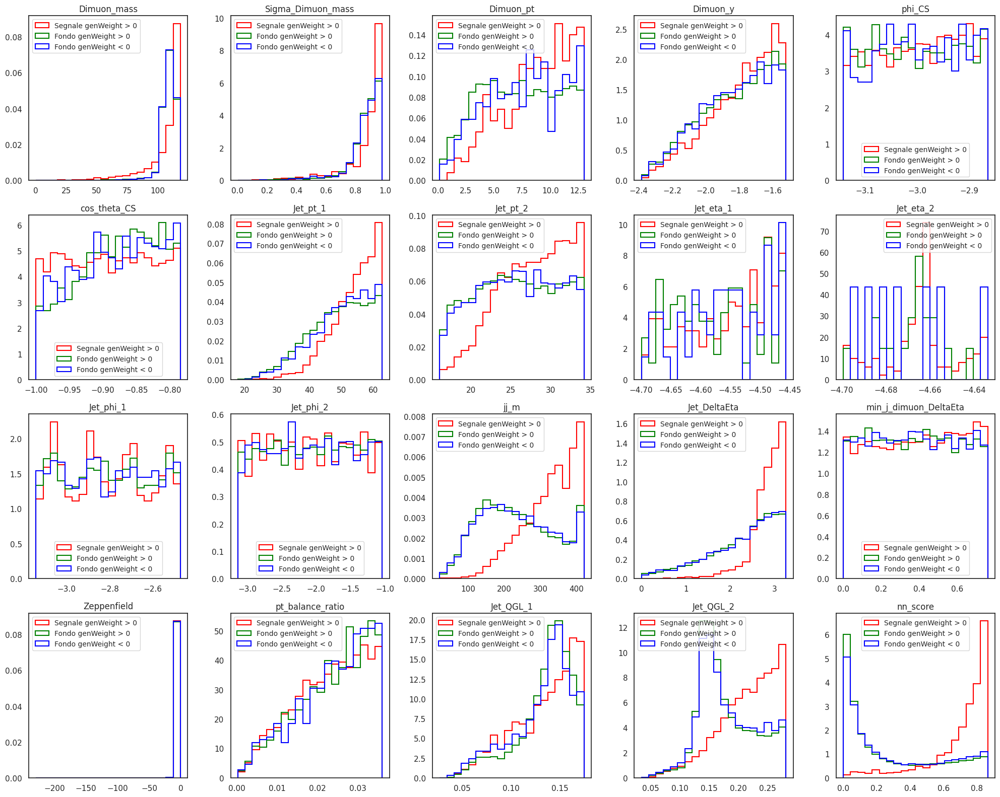

In [ ]:
plt.figure(figsize=(20, 16))
count_col = 1

mask_plus_sig = (df_shuffled["GenWeight"] > 0) & (df_shuffled["label"] == 1)
mask_minus_sig = (df_shuffled["GenWeight"] < 0) & (df_shuffled["label"] == 1)

mask_plus_bkg = (df_shuffled["GenWeight"] > 0) & (df_shuffled["label"] == 0)
mask_minus_bkg = (df_shuffled["GenWeight"] < 0) & (df_shuffled["label"] == 0)

for col in sel_features:
    plt.subplot(4, 5, count_col)

    min_val = min(df_shuffled.loc[mask_plus_sig, col].min(), df_shuffled.loc[mask_minus_sig, col].min(), df_shuffled.loc[mask_plus_bkg, col].min(), df_shuffled.loc[mask_minus_bkg, col].min())
    max_val = max(df_shuffled.loc[mask_plus_sig, col].max(), df_shuffled.loc[mask_minus_sig, col].max(), df_shuffled.loc[mask_plus_bkg, col].max(), df_shuffled.loc[mask_minus_bkg, col].max())
    bins = np.linspace(min_val, max_val, 21)

    plt.hist(df_shuffled.loc[mask_plus_sig, col], bins=bins, density=True, histtype='step', color='red', linewidth=1.5, label='Segnale genWeight > 0')
    #plt.hist(df_shuffled.loc[mask_minus_sig, col], bins=bins, density=True, histtype='step', color='orange', linewidth=1.5, label='Segnale genWeight < 0')
    plt.hist(df_shuffled.loc[mask_plus_bkg, col], bins=bins, density=True, histtype='step', color='green', linewidth=1.5, label='Fondo genWeight > 0')
    plt.hist(df_shuffled.loc[mask_minus_bkg, col], bins=bins, density=True, histtype='step', color='blue', linewidth=1.5, label='Fondo genWeight < 0')

    plt.title(col)
    plt.legend(fontsize='small')
    count_col += 1

plt.tight_layout()

In [ ]:
#mask_shuffled = df_shuffled["GenWeight"] > 0
#df_shuffled = df_shuffled.loc[mask_shuffled]
#df_shuffled

In [ ]:
mask_zeppenfield = df_shuffled["Zeppenfield"].abs() < 10
df_shuffled = df_shuffled.loc[mask_zeppenfield]
df_shuffled

,Dimuon_mass,Sigma_Dimuon_mass,Dimuon_pt,Dimuon_y,phi_CS,cos_theta_CS,Jet_pt_1,Jet_pt_2,Jet_eta_1,Jet_eta_2,...,jj_m,Jet_DeltaEta,min_j_dimuon_DeltaEta,Zeppenfield,pt_balance_ratio,Jet_QGL_1,Jet_QGL_2,nn_score,GenWeight,label
0,106.970258,1.780684,56.833071,-1.700954,2.139118,-0.415156,65.18750,49.312500,2.648438,-1.173340,...,388.572266,3.821777,1.258245,-0.945551,0.050047,0.508789,0.139404,0.628817,211.929688,0
1,126.388185,1.581375,264.485286,0.451172,-1.899440,0.587047,300.00000,61.875000,-2.367188,3.496094,...,2561.889893,5.863281,2.863710,0.577192,0.010176,0.404053,0.605469,0.998393,4.184326,1
2,139.240940,1.124026,24.699278,0.333418,1.930161,-0.184762,205.12500,176.000000,0.635010,-1.968506,...,750.718079,2.603516,0.783542,-0.371509,0.021288,0.760742,0.092712,0.776170,-211.929688,0
3,101.489830,2.451215,23.842437,-1.827372,-3.116295,-0.579979,51.12500,39.937500,2.703613,-0.983521,...,292.295013,3.687134,2.294418,-0.997462,0.332132,0.360352,0.157715,0.050973,211.929688,0
4,126.027093,1.398117,80.110506,-0.170207,-2.830678,-0.770620,82.62500,30.265625,2.617676,-3.562012,...,1096.750000,6.179688,2.931325,-0.527601,0.170825,0.408203,0.595215,0.981113,4.184326,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85747,151.355503,2.988475,72.130033,1.392512,-1.745970,0.730284,101.18750,64.375000,-0.857666,0.543579,...,187.919754,1.401245,1.641441,1.498645,0.202698,0.820312,0.134644,0.023156,211.929688,0
85748,112.690590,2.519107,53.130110,-1.959493,-2.920296,-0.289028,41.96875,25.843750,-1.492920,1.968018,...,190.623810,3.460938,1.302513,-0.070832,0.229041,0.143677,0.156738,0.020988,-211.929688,0
85749,124.095628,1.467180,96.102013,0.888664,2.116865,-0.727757,113.50000,85.625000,-2.459473,3.024902,...,1533.480469,5.484375,1.749656,0.662649,0.103407,0.724121,0.306152,0.995710,4.184326,1
85750,135.619150,2.019171,72.911952,1.045249,-2.066943,0.818280,96.31250,89.625000,-1.067871,-4.104492,...,441.051544,3.036621,2.762986,-0.155732,0.010884,0.141846,0.508301,0.420128,211.929688,0


In [ ]:
# divide i dati in un dataset di training, due di validation e uno di test
df_train_x, df_rest_x, df_train_y, df_rest_y = train_test_split(df_shuffled[features_with_gen], df_shuffled["label"], test_size=0.4, shuffle=True, random_state=75)
df_vali_x, df_rest2_x, df_vali_y, df_rest2_y = train_test_split(df_rest_x, df_rest_y, test_size=0.7, shuffle=True, random_state=723)
df_vali_weighted_x, df_test_x, df_vali_weighted_y, df_test_y = train_test_split(df_rest2_x, df_rest2_y, test_size=4./7, shuffle=True, random_state=394)

# stampa su schermo le dimensioni degli array
print('Dimensioni del dataset di training:', df_train_x.shape)
print("Dimensioni dell'array delle label di training:", df_train_y.shape)
print('Dimensioni del dataset di validation:', df_vali_x.shape)
print("Dimensioni dell'array delle label di validation:", df_vali_y.shape)
print('Dimensioni del dataset di validation con genWeight:', df_vali_weighted_x.shape)
print("Dimensioni dell'array delle label di validation con genWeight:", df_vali_weighted_y.shape)
print('Dimensioni del dataset di test:', df_test_x.shape)
print("Dimensioni dell'array delle label di test:", df_test_y.shape)

Dimensioni del dataset di training: (51393, 21)
Dimensioni dell'array delle label di training: (51393,)
Dimensioni del dataset di validation: (10278, 21)
Dimensioni dell'array delle label di validation: (10278,)
Dimensioni del dataset di validation con genWeight: (10278, 21)
Dimensioni dell'array delle label di validation con genWeight: (10278,)
Dimensioni del dataset di test: (13706, 21)
Dimensioni dell'array delle label di test: (13706,)


In [ ]:
df_train_x, df_rest_x, df_train_y, df_rest_y = train_test_split(df_shuffled[features_with_gen], df_shuffled["label"], test_size=0.4, random_state=42, stratify=df_shuffled["label"])
df_test_x, df_rest2_x, df_test_y, df_rest2_y = train_test_split(df_rest_x, df_rest_y, test_size=0.6, random_state=42, stratify=df_rest_y)
df_vali_x, df_vali_weighted_x, df_vali_y, df_vali_weighted_y = train_test_split(df_rest2_x, df_rest2_y, test_size=0.5, random_state=42, stratify=df_rest2_y)

# stampa su schermo le dimensioni degli array
print('Dimensioni del dataset di training:', df_train_x.shape)
print("Dimensioni dell'array delle label di training:", df_train_y.shape)
print('Dimensioni del dataset di validation:', df_vali_x.shape)
print("Dimensioni dell'array delle label di validation:", df_vali_y.shape)
print('Dimensioni del dataset di validation con genWeight:', df_vali_weighted_x.shape)
print("Dimensioni dell'array delle label di validation con genWeight:", df_vali_weighted_y.shape)
print('Dimensioni del dataset di test:', df_test_x.shape)
print("Dimensioni dell'array delle label di test:", df_test_y.shape)

Dimensioni del dataset di training: (51393, 21)
Dimensioni dell'array delle label di training: (51393,)
Dimensioni del dataset di validation: (10279, 21)
Dimensioni dell'array delle label di validation: (10279,)
Dimensioni del dataset di validation con genWeight: (10279, 21)
Dimensioni dell'array delle label di validation con genWeight: (10279,)
Dimensioni del dataset di test: (13704, 21)
Dimensioni dell'array delle label di test: (13704,)


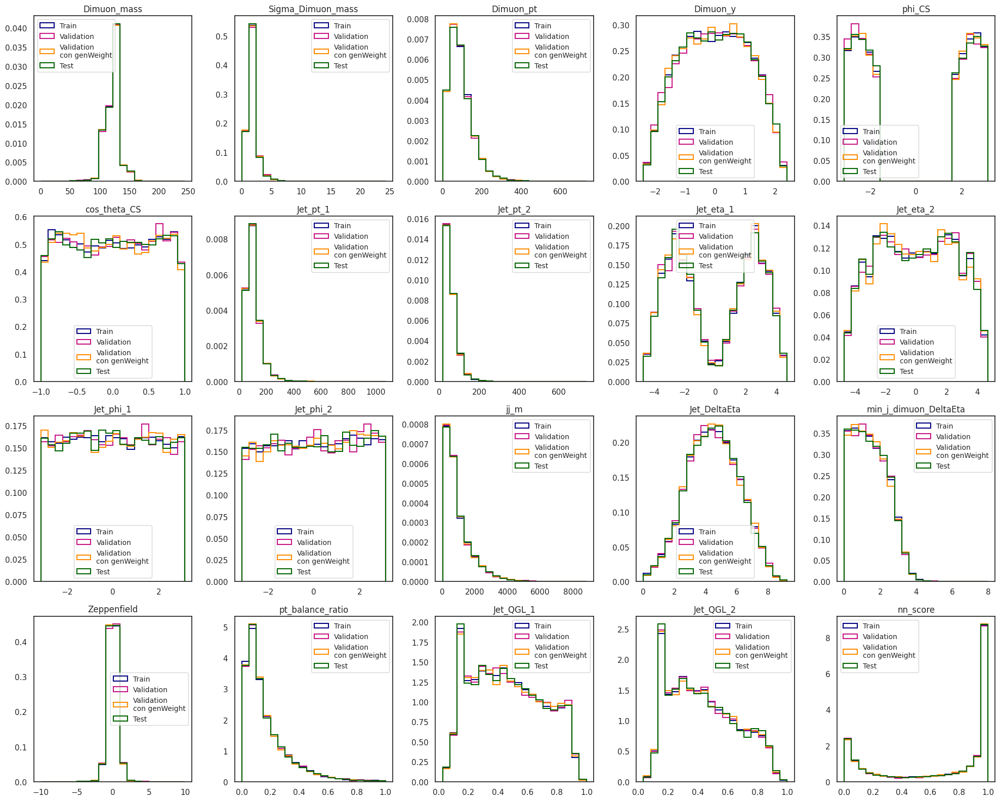

In [ ]:
plt.figure(figsize=(20, 16))
count_col = 1

for col in sel_features:
    plt.subplot(4, 5, count_col)

    min_val = min(df_train_x[col].min(), df_vali_x[col].min(), df_vali_weighted_x[col].min(), df_test_x[col].min())
    max_val = max(df_train_x[col].max(), df_vali_x[col].max(), df_vali_weighted_x[col].max(), df_test_x[col].max())
    bins = np.linspace(min_val, max_val, 21)

    # Solo contorni
    plt.hist(df_train_x[col], bins=bins, density=True, histtype='step', color='navy', linewidth=1.5, label='Train')
    plt.hist(df_vali_x[col], bins=bins, density=True, histtype='step', color='mediumvioletred', linewidth=1.5, label='Validation')
    plt.hist(df_vali_weighted_x[col], bins=bins, density=True, histtype='step', color='darkorange', linewidth=1.5, label='Validation\ncon genWeight')
    plt.hist(df_test_x[col], bins=bins, density=True, histtype='step', color='darkgreen', linewidth=1.5, label='Test')

    plt.title(col)
    plt.legend(fontsize='small')
    count_col += 1

plt.tight_layout()

In [ ]:
# normalizza i dati da dare in input alla rete neurale
mean_training = df_train_x[sel_features].mean()
std_training = df_train_x[sel_features].std()

df_train_x[sel_features]  = (df_train_x[sel_features] - mean_training)/std_training
df_vali_x[sel_features] = (df_vali_x[sel_features] - mean_training)/std_training
df_vali_weighted_x[sel_features] = (df_vali_weighted_x[sel_features] - mean_training)/std_training
df_test_x[sel_features] = (df_test_x[sel_features] - mean_training)/std_training

mean_training = df_train_x[sel_features].mean()
std_training = df_train_x[sel_features].std()
mean_vali = df_vali_x[sel_features].mean()
std_vali = df_vali_x[sel_features].std()
mean_vali_weighted = df_vali_weighted_x[sel_features].mean()
std_vali_weighted = df_vali_weighted_x[sel_features].std()
mean_test = df_test_x[sel_features].mean()
std_test = df_test_x[sel_features].std()

print("Media del training set:\n" + str(mean_training) + "\n")
print("Deviazione standard del training set:\n" + str(std_training) + "\n")
print("Media del validation set:\n" + str(mean_vali) + "\n")
print("Deviazione standard del validation set:\n" + str(std_vali) + "\n")
print("Media del validation set con genWeight:\n" + str(mean_vali_weighted) + "\n")
print("Deviazione standard del validation set con genWeight:\n" + str(std_vali_weighted) + "\n")
print("Media del test set:\n" + str(mean_test) + "\n")
print("Deviazione standard del test set:\n" + str(std_test) + "\n")

Media del training set:
Dimuon_mass             -4.155997e-16
Sigma_Dimuon_mass        1.073218e-16
Dimuon_pt                7.770027e-17
Dimuon_y                 3.069299e-17
phi_CS                  -4.361999e-17
cos_theta_CS             2.550836e-17
Jet_pt_1                -1.365582e-07
Jet_pt_2                -6.033913e-08
Jet_eta_1                1.320129e-10
Jet_eta_2                9.618144e-11
Jet_phi_1               -1.470916e-10
Jet_phi_2                1.480505e-09
jj_m                    -4.976592e-08
Jet_DeltaEta            -1.208352e-07
min_j_dimuon_DeltaEta   -7.592843e-08
Zeppenfield             -6.152148e-10
pt_balance_ratio        -1.590635e-07
Jet_QGL_1               -8.180445e-08
Jet_QGL_2               -5.198483e-08
nn_score                -6.914538e-08
dtype: float64

Deviazione standard del training set:
Dimuon_mass              1.000000
Sigma_Dimuon_mass        1.000000
Dimuon_pt                1.000000
Dimuon_y                 1.000000
phi_CS                   1

In [ ]:
# converto le feature e le label in tensori torch
X_train = torch.tensor(df_train_x[sel_features].to_numpy(), dtype=torch.float32)
X_vali  = torch.tensor(df_vali_x[sel_features].to_numpy(), dtype=torch.float32)
X_vali_weighted  = torch.tensor(df_vali_weighted_x[sel_features].to_numpy(), dtype=torch.float32)
X_test  = torch.tensor(df_test_x[sel_features].to_numpy(), dtype=torch.float32)
Y_train = torch.tensor(df_train_y.to_numpy(), dtype=torch.float32)
Y_vali  = torch.tensor(df_vali_y.to_numpy(), dtype=torch.float32)
Y_vali_weighted  = torch.tensor(df_vali_weighted_y.to_numpy(), dtype=torch.float32)
Y_test = torch.tensor(df_test_y.to_numpy(), dtype=torch.float32)

# stampa su schermo le dimensioni di tutti i tensori torch
print('Dimensioni del tensore di training:', X_train.shape)
print('Dimensioni del tensore di validation:', X_vali.shape)
print('Dimensioni del tensore di validation con genWeight:', X_vali_weighted.shape)
print('Dimensioni del tensore di test:', X_test.shape)

Dimensioni del tensore di training: torch.Size([51393, 20])
Dimensioni del tensore di validation: torch.Size([10279, 20])
Dimensioni del tensore di validation con genWeight: torch.Size([10279, 20])
Dimensioni del tensore di test: torch.Size([13704, 20])


In [ ]:
sigma_sig = 0.826 #in pb
BR_sig = 2.176E-4
sigma_bkg = 49.21 #in pb
BR_bkg = 1
lumi = 1000 #in pb^-1

weight_train = df_train_x["GenWeight"].abs()
weight_vali = df_vali_x["GenWeight"].abs()
weight_vali_weighted = df_vali_weighted_x["GenWeight"].abs()
weight_test = df_test_x["GenWeight"].abs()

# Convert PyTorch tensors to NumPy arrays for indexing
y_train_np = Y_train.numpy()
y_vali_np = Y_vali.numpy()
y_vali_weighted = Y_vali_weighted.numpy()
y_test_np = Y_test.numpy()

sum_of_all_weights_sig = 5015011.348920002
sum_of_all_weights_bkg = 2403725539.4443593
all_labels = torch.cat((Y_train, Y_vali, Y_vali_weighted, Y_test))

W_train = torch.tensor(weight_train.to_numpy(), dtype=torch.float32)
W_train = torch.where(Y_train == 1, W_train * sigma_sig * BR_sig * lumi/sum_of_all_weights_sig, W_train * sigma_bkg * BR_bkg * lumi/sum_of_all_weights_bkg)
W_train[Y_train==1] /= W_train[Y_train==1].sum()  # Somma dei pesi del segnale = 1
W_train[Y_train==0] /= W_train[Y_train==0].sum()  # Somma dei pesi del fondo = 1

W_vali = torch.tensor(weight_vali.to_numpy(), dtype=torch.float32)
W_vali = torch.where(Y_vali == 1, W_vali * sigma_sig * BR_sig * lumi/sum_of_all_weights_sig, W_vali * sigma_bkg * BR_bkg * lumi/sum_of_all_weights_bkg)
W_vali[Y_vali==1] /= W_vali[Y_vali==1].sum()  # Somma dei pesi del segnale = 1
W_vali[Y_vali==0] /= W_vali[Y_vali==0].sum()  # Somma dei pesi del fondo = 1

W_vali_weighted = torch.tensor(weight_vali_weighted.to_numpy(), dtype=torch.float32)
W_vali_weighted = torch.where(Y_vali_weighted == 1, W_vali_weighted * sigma_sig * BR_sig * lumi/sum_of_all_weights_sig, W_vali_weighted * sigma_bkg * BR_bkg * lumi/sum_of_all_weights_bkg)
W_test = torch.tensor(weight_test.to_numpy(), dtype=torch.float32)
W_test = torch.where(Y_test == 1, W_test * sigma_sig * BR_sig * lumi/sum_of_all_weights_sig, W_test * sigma_bkg * BR_bkg * lumi/sum_of_all_weights_bkg)

In [ ]:
print("Media pesi training set:\n" + str(W_train.mean()) + "+/-" + str(W_train.std()) + "\n")
print("Media pesi validation set:\n" + str(W_vali.mean()) + "+/-" + str(W_vali.std()) + "\n")
print("Media pesi validation set con genWeight:\n" + str(W_vali_weighted.mean()) + "+/-" + str(W_vali_weighted.std()) + "\n")
print("Media pesi test set:\n" + str(W_test.mean()) + "+/-" + str(W_test.std()) + "\n")

Media pesi training set:
tensor(3.8916e-05)+/-tensor(7.8692e-07)

Media pesi validation set:
tensor(0.0002)+/-tensor(3.9193e-06)

Media pesi validation set con genWeight:
tensor(0.0022)+/-tensor(0.0022)

Media pesi test set:
tensor(0.0022)+/-tensor(0.0022)



## Visualizzazione dei dati

In [ ]:
#effettua una PCA a 16 componenti sul dataset di train e stampa la varianza di ciascuna componente e quella totale di tutte le componenti
pca = PCA(n_components=16)
pca_result_train = pca.fit_transform(X_train.view(-1, 20))
exp_var_train = pca.explained_variance_ratio_

for i in range(0,len(exp_var_train)):
  print('Explained variance dataset train componente: ', i, ' = ', exp_var_train[i])
print('Explained variance totale delle prime 16 componenti della PCA per dataset di train: {}\n'.format(sum(exp_var_train)))

#effettua una PCA a 16 componenti sul dataset di validation e stampa la varianza di ciascuna componente e quella totale di tutte le componenti
#pca = PCA(n_components=16)
pca_result_vali = pca.transform(X_vali.view(-1, 20))
exp_var_vali = pca.explained_variance_ratio_

for i in range(0,len(exp_var_vali)):
  print('Explained variance dataset validation componente: ', i, ' = ', exp_var_vali[i])
print('Explained variance totale delle prime 16 componenti della PCA per dataset di validation: {}\n'.format(sum(exp_var_vali)))

#effettua una PCA a 16 componenti sul dataset di validation con genWeight e stampa la varianza di ciascuna componente e quella totale di tutte le componenti
#pca = PCA(n_components=16)
pca_result_vali_weighted = pca.transform(X_vali_weighted.view(-1, 20))
exp_var_vali_weighted = pca.explained_variance_ratio_

for i in range(0,len(exp_var_vali_weighted)):
  print('Explained variance dataset validation con genWeight componente: ', i, ' = ', exp_var_vali_weighted[i])
print('Explained variance totale delle prime 16 componenti della PCA per dataset di validation con genWeight: {}\n'.format(sum(exp_var_vali_weighted)))

#effettua una PCA a 16 componenti sul dataset di test high e stampa la varianza di ciascuna componente e quella totale di tutte le componenti
#pca = PCA(n_components=16)
pca_result_test = pca.transform(X_test.view(-1, 20))
exp_var_test = pca.explained_variance_ratio_

for i in range(0,len(exp_var_test)):
  print('Explained variance dataset test high componente: ', i, ' = ', exp_var_test[i])
print('Explained variance totale delle prime 16 componenti della PCA per dataset di test: {}\n'.format(sum(exp_var_test)))

Explained variance dataset train componente:  0  =  0.1679509117097344
Explained variance dataset train componente:  1  =  0.14481354893893933
Explained variance dataset train componente:  2  =  0.09554604873828475
Explained variance dataset train componente:  3  =  0.06335003675868461
Explained variance dataset train componente:  4  =  0.05657960294920622
Explained variance dataset train componente:  5  =  0.05231761440261392
Explained variance dataset train componente:  6  =  0.049954772967132514
Explained variance dataset train componente:  7  =  0.04907163943611843
Explained variance dataset train componente:  8  =  0.045753124739008416
Explained variance dataset train componente:  9  =  0.04361437335436842
Explained variance dataset train componente:  10  =  0.042694117643535937
Explained variance dataset train componente:  11  =  0.037468547089651597
Explained variance dataset train componente:  12  =  0.03581775313752741
Explained variance dataset train componente:  13  =  0.034

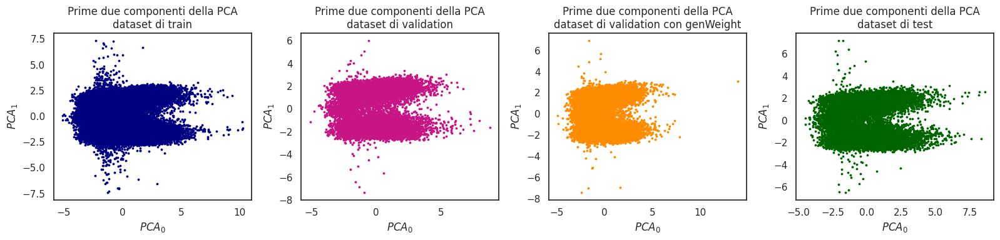

In [ ]:
plt.figure(figsize=(16, 4))

# plot del dataset di train ridotto dimensionalmente mediante PCA
plt.subplot(1, 4, 1)
plt.scatter(pca_result_train[:,0], pca_result_train[:,1], s = 3, color = "navy")
plt.title("Prime due componenti della PCA\ndataset di train")
plt.xlabel("$PCA_0$")
plt.ylabel("$PCA_1$")

# plot del dataset di validation ridotto dimensionalmente mediante PCA
plt.subplot(1, 4, 2)
plt.scatter(pca_result_vali[:,0], pca_result_vali[:,1], s = 3, color = "mediumvioletred")
plt.title("Prime due componenti della PCA\ndataset di validation")
plt.xlabel("$PCA_0$")
plt.ylabel("$PCA_1$")

# plot del dataset di validation con genWeight ridotto dimensionalmente mediante PCA
plt.subplot(1, 4, 3)
plt.scatter(pca_result_vali_weighted[:,0], pca_result_vali_weighted[:,1], s = 3, color = "darkorange")
plt.title("Prime due componenti della PCA\ndataset di validation con genWeight")
plt.xlabel("$PCA_0$")
plt.ylabel("$PCA_1$")

# plot del dataset di test ridotto dimensionalmente mediante PCA
plt.subplot(1, 4, 4)
plt.scatter(pca_result_test[:,0], pca_result_test[:,1], s = 3, color = "darkgreen")
plt.title("Prime due componenti della PCA\ndataset di test")
plt.xlabel("$PCA_0$")
plt.ylabel("$PCA_1$")

plt.tight_layout()

In [ ]:
# crea la figura con 1 riga e 4 colonne (quattro scene 3D affiancate)
fig = make_subplots(
    rows=1, cols=4,
    specs=[[{'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}]],
    subplot_titles=["Dataset di train", "Dataset di validation", "Dataset di validation con genWeight", "Dataset di test"]
)

# plot 3D del dataset di train ridotto dimensionalmente mediante PCA
fig.add_trace(go.Scatter3d(
    x=pca_result_train[:, 0],
    y=pca_result_train[:, 1],
    z=pca_result_train[:, 2],
    mode='markers',
    marker=dict(size=2, color='navy', opacity=0.8)
), row=1, col=1)

# plot 3D del dataset di validation ridotto dimensionalmente mediante PCA
fig.add_trace(go.Scatter3d(
    x=pca_result_vali[:, 0],
    y=pca_result_vali[:, 1],
    z=pca_result_vali[:, 2],
    mode='markers',
    marker=dict(size=2, color='mediumvioletred', opacity=0.8)
), row=1, col=2)

# plot 3D del dataset di validation con genWeight ridotto dimensionalmente mediante PCA
fig.add_trace(go.Scatter3d(
    x=pca_result_vali_weighted[:, 0],
    y=pca_result_vali_weighted[:, 1],
    z=pca_result_vali_weighted[:, 2],
    mode='markers',
    marker=dict(size=2, color='darkorange', opacity=0.8)
), row=1, col=3)

# plot 3D del dataset di test ridotto dimensionalmente mediante PCA
fig.add_trace(go.Scatter3d(
    x=pca_result_test[:, 0],
    y=pca_result_test[:, 1],
    z=pca_result_test[:, 2],
    mode='markers',
    marker=dict(size=2, color='darkgreen', opacity=0.8)
), row=1, col=4)

# imposta i titoli sugli assi
axis_labels = dict(
    xaxis_title='PCA_0',
    yaxis_title='PCA_1',
    zaxis_title='PCA_2'
)

fig.update_layout(
    scene=axis_labels,
    scene2=axis_labels,
    scene3=axis_labels,
    scene4=axis_labels,
    height=500,
    width=1400,
    title_text='Prime tre componenti della PCA per tutti i dataset'
)

fig.show()



# crea la figura con 1 riga e 4 colonne (quattro scene 3D affiancate)
fig = make_subplots(
    rows=1, cols=4,
    specs=[[{'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}]],
    subplot_titles=["Dataset di train", "Dataset di validation", "Dataset di validation con genWeight", "Dataset di test"]
)

# plot 3D del dataset di train ridotto dimensionalmente mediante PCA colorato secondo le label
fig.add_trace(go.Scatter3d(
    x=pca_result_train[:, 0],
    y=pca_result_train[:, 1],
    z=pca_result_train[:, 2],
    mode='markers',
    marker=dict(size=2, color=['red' if v else 'blue' for v in Y_train], opacity=0.8)
), row=1, col=1)

# plot 3D del dataset di validation ridotto dimensionalmente mediante PCA colorato secondo le label
fig.add_trace(go.Scatter3d(
    x=pca_result_vali[:, 0],
    y=pca_result_vali[:, 1],
    z=pca_result_vali[:, 2],
    mode='markers',
    marker=dict(size=2, color=['red' if v else 'blue' for v in Y_vali], opacity=0.8)
), row=1, col=2)

# plot 3D del dataset di validation con genWeight ridotto dimensionalmente mediante PCA colorato secondo le label
fig.add_trace(go.Scatter3d(
    x=pca_result_vali_weighted[:, 0],
    y=pca_result_vali_weighted[:, 1],
    z=pca_result_vali_weighted[:, 2],
    mode='markers',
    marker=dict(size=2, color=['red' if v else 'blue' for v in Y_vali_weighted], opacity=0.8)
), row=1, col=3)

# plot 3D del dataset di test ridotto dimensionalmente mediante PCA colorato secondo le label
fig.add_trace(go.Scatter3d(
    x=pca_result_test[:, 0],
    y=pca_result_test[:, 1],
    z=pca_result_test[:, 2],
    mode='markers',
    marker=dict(size=2, color=['red' if v else 'blue' for v in Y_test], opacity=0.8)
), row=1, col=4)

# imposta i titoli sugli assi
axis_labels = dict(
    xaxis_title='PCA_0',
    yaxis_title='PCA_1',
    zaxis_title='PCA_2'
)

fig.update_layout(
    scene=axis_labels,
    scene2=axis_labels,
    scene3=axis_labels,
    scene4=axis_labels,
    height=500,
    width=1400,
    title_text='Prime tre componenti della PCA per i dataset di test colorate secondo le label'
)

fig.show()

In [ ]:
'''plt.figure(figsize = (16, 4))

# plot dello spazio latente del dataset di train usando UMAP
manifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_train)
manifold_reduced_train = manifold.transform(X_train)
plt.subplot(1, 4, 1)
plt.scatter(manifold_reduced_train[:, 0], manifold_reduced_train[:, 1], color = "navy", s = 3)
plt.title("Dataset di train usando UMAP")
plt.xlabel("$UMAP_0$")
plt.ylabel("$UMAP_1$")

# plot dello spazio latente del dataset di validation usando UMAP
manifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_vali)
manifold_reduced_vali = manifold.transform(X_vali)
plt.subplot(1, 4, 2)
plt.scatter(manifold_reduced_vali[:, 0], manifold_reduced_vali[:, 1], color = "mediumvioletred", s = 3)
plt.title("Dataset di validation usando UMAP")
plt.xlabel("$UMAP_0$")
plt.ylabel("$UMAP_1$")

# plot dello spazio latente del dataset di validation con genWeight usando UMAP
manifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_vali_weighted)
manifold_reduced_vali_weighted = manifold.transform(X_vali_weighted)
plt.subplot(1, 4, 3)
plt.scatter(manifold_reduced_vali_weighted[:, 0], manifold_reduced_vali_weighted[:, 1], color = "darkorange", s = 3)
plt.title("Dataset di validation con genWeight usando UMAP")
plt.xlabel("$UMAP_0$")
plt.ylabel("$UMAP_1$")

# plot dello spazio latente del dataset di test usando UMAP
manifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_test)
manifold_reduced_test = manifold.transform(X_test)
plt.subplot(1, 4, 4)
plt.scatter(manifold_reduced_test[:, 0], manifold_reduced_test[:, 1], color = "darkgreen", s = 3)
plt.title("Dataset di test usando UMAP")
plt.xlabel("$UMAP_0$")
plt.ylabel("$UMAP_1$")

plt.tight_layout()'''

'plt.figure(figsize = (16, 4))\n\n# plot dello spazio latente del dataset di train usando UMAP\nmanifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_train)\nmanifold_reduced_train = manifold.transform(X_train)\nplt.subplot(1, 4, 1)\nplt.scatter(manifold_reduced_train[:, 0], manifold_reduced_train[:, 1], color = "navy", s = 3)\nplt.title("Dataset di train usando UMAP")\nplt.xlabel("$UMAP_0$")\nplt.ylabel("$UMAP_1$")\n\n# plot dello spazio latente del dataset di validation usando UMAP\nmanifold = umap.UMAP(n_components = 3, n_neighbors=15, min_dist=0.5, metric = "euclidean").fit(X_vali)\nmanifold_reduced_vali = manifold.transform(X_vali)\nplt.subplot(1, 4, 2)\nplt.scatter(manifold_reduced_vali[:, 0], manifold_reduced_vali[:, 1], color = "mediumvioletred", s = 3)\nplt.title("Dataset di validation usando UMAP")\nplt.xlabel("$UMAP_0$")\nplt.ylabel("$UMAP_1$")\n\n# plot dello spazio latente del dataset di validation con genWeight usando UMAP\nmanif

## Costruzione della DNN

In [ ]:
# definizione della batch size
batch_size_train=1024
batch_size_vali=512
batch_size_test=512

# creazione dei dataloader
dataset_train = TensorDataset(X_train, Y_train, W_train)
dataloader_train = DataLoader(dataset_train, batch_size=batch_size_train, shuffle=False, drop_last=True)

dataset_vali = TensorDataset(X_vali, Y_vali, W_vali)
dataloader_vali = DataLoader(dataset_vali, batch_size=batch_size_vali, shuffle=False, drop_last = True)

dataset_vali_weighted = TensorDataset(X_vali_weighted, Y_vali_weighted, W_vali_weighted)
dataloader_vali_weighted = DataLoader(dataset_vali_weighted, batch_size=batch_size_vali, shuffle=False, drop_last = True)

dataset_test = TensorDataset(X_test, Y_test, W_test)
dataloader_test = DataLoader(dataset_test, batch_size=batch_size_test, shuffle = False, drop_last = True)

In [ ]:
class DNN(nn.Module):
    def __init__(self, input_size, hidden_size, out_size, dropout_p=0.3):
        super(DNN, self).__init__()

        self.linear = nn.Linear(input_size, hidden_size)
        self.bn1 = nn.BatchNorm1d(hidden_size)  # batch normalization

        self.linear2 = nn.Linear(hidden_size, 2*hidden_size)
        self.bn2 = nn.BatchNorm1d(2*hidden_size)

        self.linear3 = nn.Linear(2*hidden_size, hidden_size)
        self.bn3 = nn.BatchNorm1d(hidden_size)

        self.linear4 = nn.Linear(hidden_size, out_size)

        self.act = nn.ReLU()
        self.drop = nn.Dropout(p=dropout_p)  # dropout

    def forward(self, x):
        x = self.linear(x)
        x = self.bn1(x)
        x = self.act(x)
        x = self.drop(x)

        x = self.linear2(x)
        x = self.bn2(x)
        x = self.act(x)
        x = self.drop(x)

        x = self.linear3(x)
        x = self.bn3(x)
        x = self.act(x)
        x = self.drop(x)

        x = self.linear4(x)
        return x

In [ ]:
class DNN2(nn.Module):
    def __init__(self, input_size, hidden_size, out_size, dropout_p=0.3):
        super(DNN2, self).__init__()

        self.linear = nn.Linear(input_size, 2*hidden_size)
        self.bn1 = nn.BatchNorm1d(2*hidden_size)  # batch normalization

        self.linear2 = nn.Linear(2*hidden_size, hidden_size)
        self.bn2 = nn.BatchNorm1d(hidden_size)

        self.linear4 = nn.Linear(hidden_size, out_size)

        self.act = nn.ReLU()
        self.drop = nn.Dropout(p=dropout_p)  # dropout

    def forward(self, x):
        x = self.linear(x)
        x = self.bn1(x)
        x = self.act(x)
        x = self.drop(x)

        x = self.linear2(x)
        x = self.bn2(x)
        x = self.act(x)
        x = self.drop(x)

        x = self.linear4(x)
        return x

In [ ]:
input_size = X_train.shape[1]
output_size = 1
hidden_size = 128
dnn = DNN(input_size, hidden_size, output_size, dropout_p = 0.2)

#stampa su schermo un sommario del modello di DNN utilizzato
print(dnn)

if torch.cuda.is_available():
  summary(dnn.cuda(), input_size=(20,))
else:
  summary(dnn, input_size=(20,))

DNN(
  (linear): Linear(in_features=20, out_features=128, bias=True)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (linear2): Linear(in_features=128, out_features=256, bias=True)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (linear3): Linear(in_features=256, out_features=128, bias=True)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (linear4): Linear(in_features=128, out_features=1, bias=True)
  (act): ReLU()
  (drop): Dropout(p=0.2, inplace=False)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]           2,688
       BatchNorm1d-2                  [-1, 128]             256
              ReLU-3                  [-1, 128]               0
           Dropout-4                  [-1, 128]               0
            Linear-5  

## Allenamento della rete neurale

In [ ]:
# definizione della funzione di loss
criterion = nn.BCEWithLogitsLoss(reduction='none')

#definizione del learning rate
LR = 1e-4

#definizione dell'ottimizzatore
optimizer = torch.optim.Adam(params=dnn.parameters(), lr=LR, weight_decay=1e-5)

In [ ]:
# controllo se la GPU è disponibile
if torch.cuda.is_available():
  print('Numero di GPU disponibili:', torch.cuda.device_count())
  for i in range(0,torch.cuda.device_count()):
    print(torch.cuda.get_device_name(i))

# se la GPU è disponibile setto device='cuda', altrimenti 'cpu'
device = ('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Computation device: {device}\n")

Numero di GPU disponibili: 1
Tesla T4
Computation device: cuda



In [ ]:
def max_significance(y_true, y_score, W, n_bins=2000):
    n_bins = int(n_bins)
    thresholds = np.linspace(0.5, 1, n_bins+1)
    Z = np.zeros_like(thresholds)

    for i, thr in enumerate(thresholds):
        sel = y_score > thr
        S = np.sum(W[(y_true == 1) & sel])
        B = np.sum(W[(y_true == 0) & sel])
        Z[i] = S/np.sqrt(B) if B > 0 else 0

    return thresholds[np.argmax(Z)], np.max(Z), Z, Z.max(), thresholds

In [ ]:
# Impostazioni
epochs = 100
hist_loss = []
hist_loss_weighted = []
hist_val_loss = []
hist_val_weighted_loss = []

roc_auc_list = []
pr_auc_list = []
max_significance_list = []
roc_auc_list_weighted = []
pr_auc_list_weighted = []
max_significance_list_weighted = []

# Metti il modello in modalità device
dnn.to(device)

for epoch in range(epochs):
    t0 = time.time()

    # --- TRAINING STEP ---
    dnn.train()
    train_loss = 0
    counter = 0

    for X_batch, Y_batch, W_batch in dataloader_train:
        counter += 1
        X_batch = X_batch.to(device)
        Y_batch = Y_batch.float().to(device)
        W_batch = W_batch.float().to(device)

        # forward pass
        y_pred = dnn(X_batch).flatten()  # output [batch_size]

        # BCE con pesi
        loss = criterion(y_pred, Y_batch)
        weighted_loss = (loss * W_batch).sum() / W_batch.sum()

        # backpropagation
        optimizer.zero_grad()
        weighted_loss.backward()
        optimizer.step()

        train_loss += weighted_loss.item()

    train_loss /= counter
    hist_loss.append(train_loss)

    # --- VALIDATION STEP ---
    dnn.eval()
    val_loss = 0
    val_counter = 0

    all_labels = []
    all_probs = []
    all_weights = []

    with torch.no_grad():
        for X_batch, Y_batch, W_batch in dataloader_vali:
            W_batch = W_batch.abs()
            val_counter += 1
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.float().to(device)
            W_batch = W_batch.float().to(device)

            y_pred = dnn(X_batch).flatten()
            loss = criterion(y_pred, Y_batch)
            weighted_loss = (loss * W_batch).sum() / W_batch.sum()
            val_loss += weighted_loss.item()

            probs = torch.sigmoid(y_pred)  # probabilità [0,1]

            all_labels.extend(Y_batch.cpu().numpy().tolist())
            all_probs.extend(probs.cpu().numpy().tolist())
            all_weights.extend(W_batch.cpu().numpy().tolist())

    val_loss /= val_counter
    hist_val_loss.append(val_loss)


    # Converti in array numpy
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    all_weights = np.array(all_weights)

    # calcola la ROC, il PR e la massima significanza
    fpr, tpr, thresholds = roc_curve(all_labels, all_probs, sample_weight=all_weights)
    # Explicitly sort fpr, tpr, and thresholds
    #sorted_indices = np.argsort(fpr)
    #fpr = fpr[sorted_indices]
    #tpr = tpr[sorted_indices]
    #thresholds = thresholds[sorted_indices]
    roc_auc = auc(fpr, tpr)
    roc_auc_list.append(roc_auc)

    precision, recall, _ = precision_recall_curve(all_labels, all_probs, sample_weight=all_weights)
    pr_auc_score = average_precision_score(all_labels, all_probs, sample_weight=all_weights)
    pr_auc_list.append(pr_auc_score)

    thr_best, Z_best, Z_array, eff_sig, thr_array = max_significance(all_labels, all_probs, all_weights)
    max_significance_list.append(Z_best)



    # --- VALIDATION STEP CON PESI ---
    dnn.eval()
    val_loss_weighted = 0
    val_weighted_counter = 0

    all_labels_weighted = []
    all_probs_weighted = []
    all_weights_weighted = []

    with torch.no_grad():
        for X_batch, Y_batch, W_batch in dataloader_vali_weighted:
            W_batch = W_batch.abs()
            val_weighted_counter += 1
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.float().to(device)
            W_batch = W_batch.float().to(device)

            y_pred = dnn(X_batch).flatten()
            loss = criterion(y_pred, Y_batch)
            weighted_loss = (loss * W_batch).sum() / W_batch.sum()
            val_loss_weighted += weighted_loss.item()

            probs = torch.sigmoid(y_pred)  # probabilità [0,1]

            all_labels_weighted.extend(Y_batch.cpu().numpy().tolist())
            all_probs_weighted.extend(probs.cpu().numpy().tolist())
            all_weights_weighted.extend(W_batch.cpu().numpy().tolist())


    val_loss_weighted /= val_weighted_counter
    hist_val_weighted_loss.append(val_loss_weighted)


    # Converti in array numpy
    all_labels_weighted = np.array(all_labels_weighted)
    all_probs_weighted = np.array(all_probs_weighted)
    all_weights_weighted = np.array(all_weights_weighted)

    # calcola la ROC, il PR e la massima significanza
    fpr, tpr, thresholds = roc_curve(all_labels_weighted, all_probs_weighted, sample_weight=all_weights_weighted)
    # Explicitly sort fpr, tpr, and thresholds
    sorted_indices = np.argsort(fpr)
    fpr = fpr[sorted_indices]
    tpr = tpr[sorted_indices]
    thresholds = thresholds[sorted_indices]
    roc_auc = auc(fpr, tpr)
    roc_auc_list_weighted.append(roc_auc)

    precision, recall, _ = precision_recall_curve(all_labels_weighted, all_probs_weighted, sample_weight=all_weights_weighted)
    pr_auc_score = average_precision_score(all_labels_weighted, all_probs_weighted, sample_weight=all_weights_weighted)
    pr_auc_list_weighted.append(pr_auc_score)

    thr_best, Z_best, Z_array, eff_sig, thr_array = max_significance(all_labels_weighted, all_probs_weighted, all_weights_weighted)
    max_significance_list_weighted.append(Z_best)


    elapsed_time = time.time() - t0
    torch.cuda.empty_cache()

    print(f"Epoch: {epoch+1}/{epochs}, Time: {elapsed_time:.2f} s, Train loss: {train_loss:.8f}, Validation loss: {val_loss:.8f}, Validation loss con genWeight: {val_loss_weighted:.8f}")


Epoch: 1/100, Time: 1.27 s, Train loss: 0.52566964, Validation loss: 0.37552713, Validation loss con genWeight: 0.34313402
Epoch: 2/100, Time: 1.53 s, Train loss: 0.33919971, Validation loss: 0.29143794, Validation loss con genWeight: 0.30365899
Epoch: 3/100, Time: 1.98 s, Train loss: 0.29095767, Validation loss: 0.26808228, Validation loss con genWeight: 0.29971304
Epoch: 4/100, Time: 1.79 s, Train loss: 0.27062282, Validation loss: 0.25429583, Validation loss con genWeight: 0.28970709
Epoch: 5/100, Time: 1.21 s, Train loss: 0.25831217, Validation loss: 0.24384781, Validation loss con genWeight: 0.28160673
Epoch: 6/100, Time: 1.15 s, Train loss: 0.24927052, Validation loss: 0.23392323, Validation loss con genWeight: 0.26919192
Epoch: 7/100, Time: 1.20 s, Train loss: 0.24051380, Validation loss: 0.22408117, Validation loss con genWeight: 0.26027668
Epoch: 8/100, Time: 1.16 s, Train loss: 0.23097581, Validation loss: 0.21404894, Validation loss con genWeight: 0.25133179
Epoch: 9/100, Ti

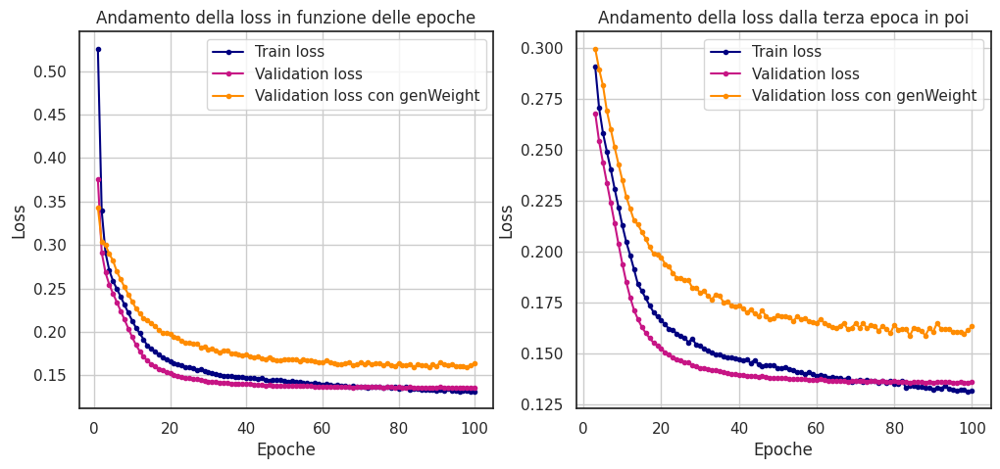

In [ ]:
plt.figure(figsize = (12, 5))

# andamento della loss completo, con tutte le epoche di training
plt.subplot(1, 2, 1)
plt.plot(range(1,len(hist_loss)+1), hist_loss, color="navy", linestyle='-', label='Train loss', marker = "o", markersize = 3)
plt.plot(range(1,len(hist_val_loss)+1), hist_val_loss, color="mediumvioletred", linestyle='-', label='Validation loss', marker = "o", markersize = 3)
plt.plot(range(1,len(hist_val_weighted_loss)+1), hist_val_weighted_loss, color="darkorange", linestyle='-', label='Validation loss con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della loss in funzione delle epoche")
plt.xlabel('Epoche')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# andamento della loss dalla terza epoca in poi
plt.subplot(1, 2, 2)
plt.plot(range(3,len(hist_loss)+1), hist_loss[2:], color="navy", linestyle='-', label='Train loss', marker = "o", markersize = 3)
plt.plot(range(3,len(hist_val_loss)+1), hist_val_loss[2:], color="mediumvioletred", linestyle='-', label='Validation loss', marker = "o", markersize = 3)
plt.plot(range(3,len(hist_val_weighted_loss)+1), hist_val_weighted_loss[2:], color="darkorange", linestyle='-', label='Validation loss con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della loss dalla terza epoca in poi")
plt.xlabel('Epoche')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

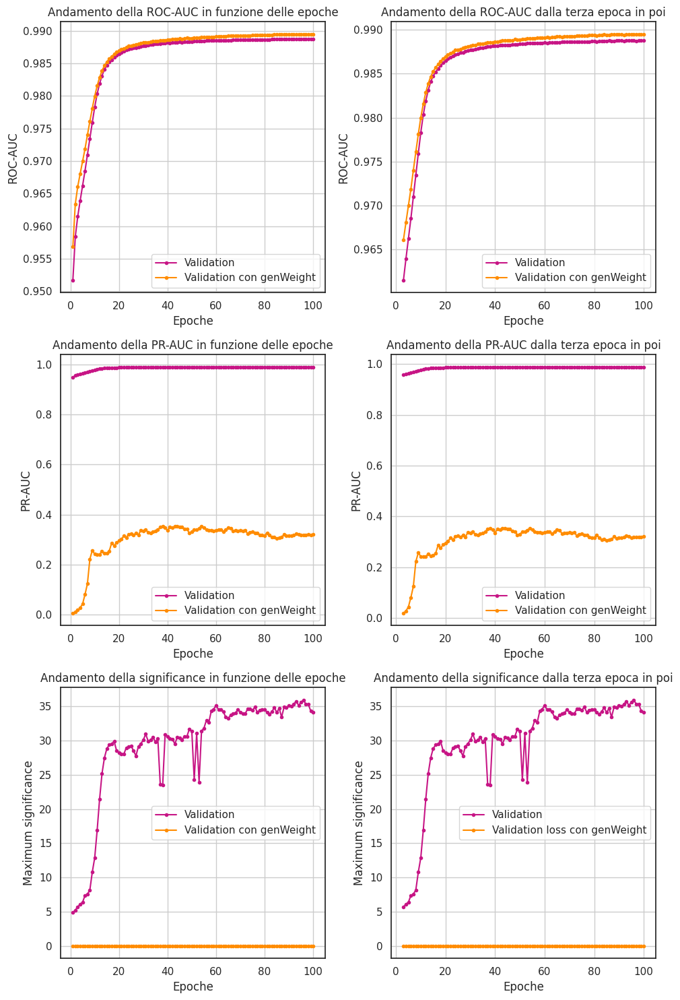

In [ ]:
plt.figure(figsize = (10, 15))

# andamento della ROC-AUC completo, con tutte le epoche di training
plt.subplot(3, 2, 1)
plt.plot(range(1,len(roc_auc_list)+1), roc_auc_list, color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(1,len(roc_auc_list_weighted)+1), roc_auc_list_weighted, color="darkorange", linestyle='-', label='Validation con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della ROC-AUC in funzione delle epoche")
plt.xlabel('Epoche')
plt.ylabel('ROC-AUC')
plt.grid(True)
plt.legend()

# andamento della ROC-AUC dalla terza epoca in poi
plt.subplot(3, 2, 2)
plt.plot(range(3,len(roc_auc_list)+1), roc_auc_list[2:], color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(3,len(roc_auc_list_weighted)+1), roc_auc_list_weighted[2:], color="darkorange", linestyle='-', label='Validation con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della ROC-AUC dalla terza epoca in poi")
plt.xlabel('Epoche')
plt.ylabel('ROC-AUC')
plt.grid(True)
plt.legend()


# andamento della PR-AUC completo, con tutte le epoche di training
plt.subplot(3, 2, 3)
plt.plot(range(1,len(pr_auc_list)+1), pr_auc_list, color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(1,len(pr_auc_list_weighted)+1), pr_auc_list_weighted, color="darkorange", linestyle='-', label='Validation con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della PR-AUC in funzione delle epoche")
plt.xlabel('Epoche')
plt.ylabel('PR-AUC')
plt.grid(True)
plt.legend()

# andamento della PR-AUC dalla terza epoca in poi
plt.subplot(3, 2, 4)
plt.plot(range(3,len(pr_auc_list)+1), pr_auc_list[2:], color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(3,len(pr_auc_list_weighted)+1), pr_auc_list_weighted[2:], color="darkorange", linestyle='-', label='Validation con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della PR-AUC dalla terza epoca in poi")
plt.xlabel('Epoche')
plt.ylabel('PR-AUC')
plt.grid(True)
plt.legend()


# andamento della significance completo, con tutte le epoche di training
plt.subplot(3, 2, 5)
plt.plot(range(1,len(max_significance_list)+1), max_significance_list, color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(1,len(max_significance_list_weighted)+1), max_significance_list_weighted, color="darkorange", linestyle='-', label='Validation con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della significance in funzione delle epoche")
plt.xlabel('Epoche')
plt.ylabel('Maximum significance')
plt.grid(True)
plt.legend()

# andamento della significance dalla terza epoca in poi
plt.subplot(3, 2, 6)
plt.plot(range(3,len(max_significance_list)+1), max_significance_list[2:], color="mediumvioletred", linestyle='-', label='Validation', marker = "o", markersize = 3)
plt.plot(range(3,len(max_significance_list_weighted)+1), max_significance_list_weighted[2:], color="darkorange", linestyle='-', label='Validation loss con genWeight', marker = "o", markersize = 3)
plt.title("Andamento della significance dalla terza epoca in poi")
plt.xlabel('Epoche')
plt.ylabel('Maximum significance')
plt.grid(True)
plt.legend()

plt.tight_layout()

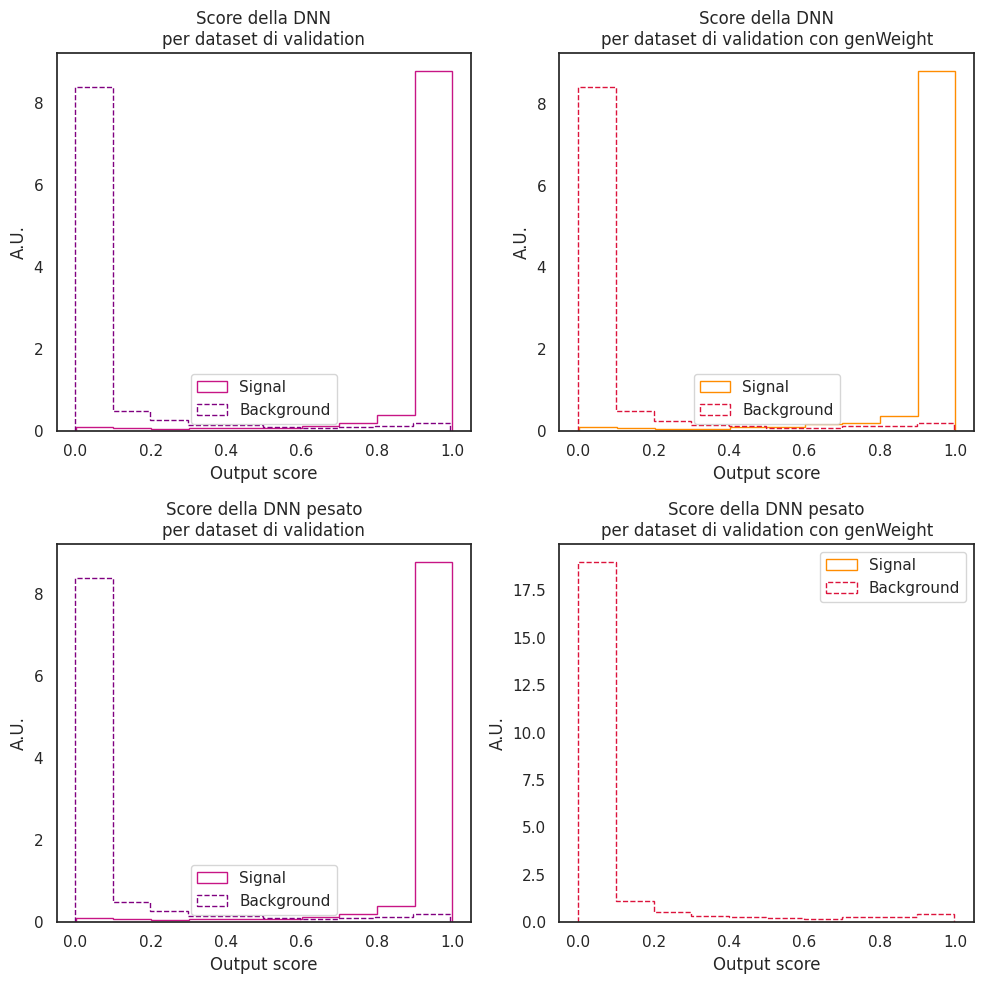

In [ ]:
# Supponendo che all_labels e all_probs siano numpy array
mask_signal = (all_labels == 1)
mask_background = (all_labels == 0)

mask_signal_weighted = (all_labels_weighted == 1)
mask_background_weighted = (all_labels_weighted == 0)

all_probs = all_probs.flatten()
all_probs_weighted = all_probs_weighted.flatten()


plt.figure(figsize = (10, 10))
plt.subplot(2, 2, 1)
plt.hist(all_probs[mask_signal], label='Signal', density=True, histtype='step', linestyle = "-", color="mediumvioletred")
plt.hist(all_probs[mask_background], label='Background', density=True, histtype='step', linestyle = "--", color="purple")
plt.title("Score della DNN\nper dataset di validation")
plt.xlabel("Output score")
plt.ylabel("A.U.")
plt.legend()

plt.subplot(2, 2, 2)
plt.hist(all_probs_weighted[mask_signal_weighted], label='Signal', density=True, histtype='step', linestyle = "-", color="darkorange")
plt.hist(all_probs_weighted[mask_background_weighted], label='Background', density=True, histtype='step', linestyle = "--", color="crimson")
plt.title("Score della DNN\nper dataset di validation con genWeight")
plt.xlabel("Output score")
plt.ylabel("A.U.")
plt.legend()

plt.subplot(2, 2, 3)
plt.hist(all_probs[mask_signal], weights=all_weights[mask_signal], label='Signal', density=True, histtype='step', linestyle = "-", color="mediumvioletred")
plt.hist(all_probs[mask_background], weights=all_weights[mask_background], label='Background', density=True, histtype='step', linestyle = "--", color="purple")
plt.title("Score della DNN pesato\nper dataset di validation")
plt.xlabel("Output score")
plt.ylabel("A.U.")
plt.legend()

plt.subplot(2, 2, 4)
plt.hist(all_probs_weighted[mask_signal_weighted], weights=all_weights_weighted[mask_signal_weighted], histtype='step', linestyle="-", color="darkorange", label='Signal')
plt.hist(all_probs_weighted[mask_background_weighted], weights=all_weights_weighted[mask_background_weighted], histtype='step', linestyle="--", color="crimson", label='Background')
plt.title("Score della DNN pesato\nper dataset di validation con genWeight")
plt.xlabel("Output score")
plt.ylabel("A.U.")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Imposta il modello in modalità evaluation
dnn.eval()

# Liste per salvare le loss per ogni campione
ev_train_loss = []
ev_vali_loss = []
ev_vali_weighted_loss = []
ev_test_loss = []

def get_loss_per_sample(dataloader, model, criterion, device):
    losses = []
    with torch.no_grad():
        for xb, yb, wb in dataloader:
            xb = xb.to(device)
            yb = yb.to(device).float().view(-1, 1)
            # forward pass
            xhat = model(xb)
            # calcola BCE loss senza reduction
            loss_per_sample = criterion(xhat, yb)
            # media sulle feature per ottenere 1 valore per esempio
            loss_per_sample = loss_per_sample.mean(dim=1)
            losses.extend(loss_per_sample.cpu().numpy())
    return losses

def get_weighted_loss_per_sample(dataloader, model, criterion, device):
    model.eval()
    losses = []

    with torch.no_grad():
        for xb, yb, wb in dataloader:
            xb = xb.to(device)
            yb = yb.to(device).float().view(-1, 1)
            wb = wb.to(device).float().view(-1)  # shape [batch_size]

            # forward pass
            xhat = model(xb)

            # loss per esempio
            loss_per_sample = criterion(xhat, yb).mean(dim=1)  # shape [batch_size]

            # applica i pesi (shape compatibile)
            loss_per_sample.mul_(wb)

            # salva tensore
            losses.append(loss_per_sample.cpu())

    all_losses = torch.cat(losses, dim=0).numpy()
    return all_losses

# Calcola le loss per ogni dataset
ev_train_loss = get_weighted_loss_per_sample(dataloader_train, dnn, criterion, device)
ev_vali_loss  = get_weighted_loss_per_sample(dataloader_vali, dnn, criterion, device)
ev_vali_loss_weighted  = get_weighted_loss_per_sample(dataloader_vali_weighted, dnn, criterion, device)
ev_test_loss  = get_weighted_loss_per_sample(dataloader_test, dnn, criterion, device)

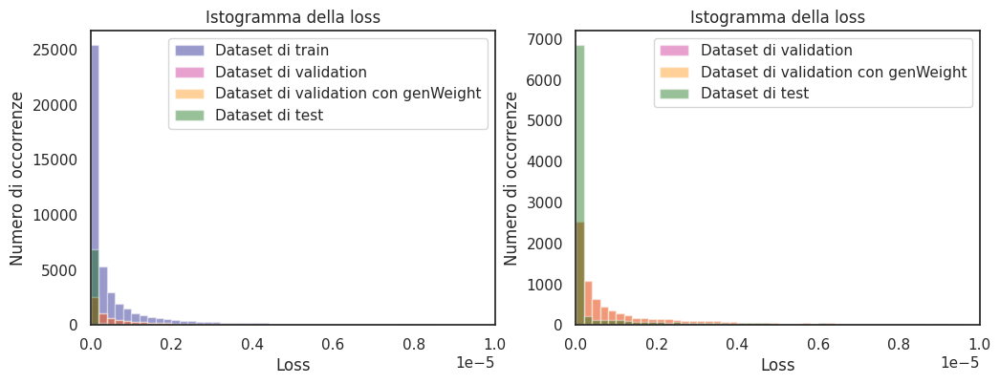

In [ ]:
# lista di tutte le loss da includere
all_losses = np.concatenate([ev_train_loss, ev_vali_loss, ev_vali_weighted_loss, ev_test_loss])

plt.figure(figsize = (12, 4))
plt.subplot(1, 2, 1)
n_bins = np.linspace(0, 0.00001, 51)
plt.hist(ev_train_loss, bins=n_bins, label='Dataset di train', alpha=0.4, color="navy")
plt.hist(ev_vali_loss, bins=n_bins, label='Dataset di validation', alpha=0.4, color="mediumvioletred")
plt.hist(ev_vali_loss, bins=n_bins, label='Dataset di validation con genWeight', alpha=0.4, color="darkorange")
plt.hist(ev_test_loss, bins=n_bins, label='Dataset di test', alpha=0.4, color="darkgreen")
plt.xlim(0, 0.00001)
plt.title("Istogramma della loss")
plt.xlabel("Loss")
plt.ylabel("Numero di occorrenze")
plt.legend()

plt.subplot(1, 2, 2)
n_bins = np.linspace(0, 0.00001, 51)
plt.hist(ev_vali_loss, bins=n_bins, label='Dataset di validation', alpha=0.4, color="mediumvioletred")
plt.hist(ev_vali_loss, bins=n_bins, label='Dataset di validation con genWeight', alpha=0.4, color="darkorange")
plt.hist(ev_test_loss, bins=n_bins, label='Dataset di test', alpha=0.4, color="darkgreen")
plt.xlim(0, 0.00001)
plt.title("Istogramma della loss")
plt.xlabel("Loss")
plt.ylabel("Numero di occorrenze")
plt.legend()

plt.show()

## Prestazioni della rete neurale

In [ ]:
def compute_metrics_weighted(model, dataloader, device):

    #Calcola ROC/AUC, PR e significance con pesi per evento
    model.eval()
    all_labels = []
    all_probs = []
    all_weights = []

    with torch.no_grad():
        for X_batch, Y_batch, W_batch in dataloader:

            X_batch = X_batch.to(device)
            Y_batch = Y_batch.cpu().numpy()
            W_batch = W_batch.cpu().numpy()

            logits = model(X_batch).flatten()
            probs = torch.sigmoid(logits)  # probabilità [0,1]

            all_labels.extend(Y_batch)
            all_probs.extend(probs.cpu().numpy())
            all_weights.extend(W_batch)

    # Converti in array numpy
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    all_weights = np.array(all_weights)

    # calcola la ROC, il PR e la massima significanza
    fpr, tpr, thresholds = roc_curve(all_labels, all_probs, sample_weight=all_weights)
    # Explicitly sort fpr, tpr, and thresholds
    #sorted_indices = np.argsort(fpr)
    #fpr = fpr[sorted_indices]
    #tpr = tpr[sorted_indices]
    #thresholds = thresholds[sorted_indices]
    roc_auc = auc(fpr, tpr)

    precision, recall, _ = precision_recall_curve(all_labels, all_probs, sample_weight=all_weights)
    pr_auc_score = average_precision_score(all_labels, all_probs, sample_weight=all_weights)

    thr_best, Z_best, Z_array, eff_sig, thr_array = max_significance(all_labels, all_probs, all_weights)

    return {
        "all_labels": all_labels,
        "all_probs": all_probs,
        "all_weights": all_weights,
        "fpr": fpr,
        "tpr": tpr,
        "roc_auc": roc_auc,
        "precision": precision,
        "recall": recall,
        "pr_auc": pr_auc_score,
        "thr_best" : thr_best,
        "Z_best" : Z_best,
        "Z_array" : Z_array,
        "eff_sig" : eff_sig,
        "thr_array" : thr_array
    }

In [ ]:
def compute_confusion_matrix(model, dataloader, device, threshold=0.5):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for X_batch, Y_batch, *rest in dataloader:  # supporta anche dataloader con 2 o più elementi
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.cpu().numpy()  # portiamo su CPU

            logits = model(X_batch).flatten()
            probs = torch.sigmoid(logits)  # probabilità [0,1]

            all_labels.extend(Y_batch)
            preds = (probs > threshold).int().cpu().numpy()

            all_preds.extend(preds)

    # Confusion matrix: righe = vere, colonne = predette
    cm = confusion_matrix(all_labels, all_preds)
    report = classification_report(all_labels, all_preds, digits=3)

    return cm, report, all_labels, all_preds

In [ ]:
metrics_train = compute_metrics_weighted(dnn, dataloader_train, device)
metrics_vali  = compute_metrics_weighted(dnn, dataloader_vali, device)
metrics_vali_weighted  = compute_metrics_weighted(dnn, dataloader_vali_weighted, device)
metrics_test  = compute_metrics_weighted(dnn, dataloader_test, device)

y_true_train = metrics_train["all_labels"]
y_prob_train = metrics_train["all_probs"]
roc_auc_train = metrics_train["roc_auc"]
pr_auc_train = metrics_train["pr_auc"]
recall_weighted_train = metrics_train["recall"]
Z_best_train = metrics_train["Z_best"]
thr_best_train = metrics_train["thr_best"]
Z_array_train = metrics_train["Z_array"]
thr_array_train = metrics_train["thr_array"]
fpr_train = metrics_train["fpr"]
tpr_train = metrics_train["tpr"]
precision_train = metrics_train["precision"]
recall_train = metrics_train["recall"]

y_true_vali = metrics_vali["all_labels"]
y_prob_vali = metrics_vali["all_probs"]
roc_auc_vali = metrics_vali["roc_auc"]
pr_auc_vali = metrics_vali["pr_auc"]
recall_vali = metrics_vali["recall"]
Z_best_vali = metrics_vali["Z_best"]
thr_best_vali = metrics_vali["thr_best"]
Z_array_vali = metrics_vali["Z_array"]
thr_array_vali = metrics_vali["thr_array"]
fpr_vali = metrics_vali["fpr"]
tpr_vali = metrics_vali["tpr"]
precision_vali = metrics_vali["precision"]
recall_vali = metrics_vali["recall"]

y_true_vali_weighted = metrics_vali_weighted["all_labels"]
y_prob_vali_weighted = metrics_vali_weighted["all_probs"]
roc_auc_vali_weighted = metrics_vali_weighted["roc_auc"]
pr_auc_vali_weighted = metrics_vali_weighted["pr_auc"]
recall_vali_weighted = metrics_vali_weighted["recall"]
Z_best_vali_weighted = metrics_vali_weighted["Z_best"]
thr_best_vali_weighted = metrics_vali_weighted["thr_best"]
Z_array_vali_weighted = metrics_vali_weighted["Z_array"]
thr_array_vali_weighted = metrics_vali_weighted["thr_array"]
fpr_vali_weighted = metrics_vali_weighted["fpr"]
tpr_vali_weighted = metrics_vali_weighted["tpr"]
precision_vali_weighted = metrics_vali_weighted["precision"]
recall_vali_weighted = metrics_vali_weighted["recall"]

y_true_test = metrics_test["all_labels"]
y_prob_test = metrics_test["all_probs"]
roc_auc_test = metrics_test["roc_auc"]
pr_auc_test = metrics_test["pr_auc"]
recall_test = metrics_test["recall"]
Z_best_test = metrics_test["Z_best"]
thr_best_test = metrics_test["thr_best"]
Z_array_test = metrics_test["Z_array"]
thr_array_test = metrics_test["thr_array"]
fpr_test = metrics_test["fpr"]
tpr_test = metrics_test["tpr"]
precision_test = metrics_test["precision"]
recall_test = metrics_test["recall"]

print("Dataset di Train: "f"ROC AUC={roc_auc_train:.3f}, "f"PR AUC={pr_auc_train:.3f}, "f"thr_best={thr_best_train:.3f}, "f"Zmax={Z_best_train:.4f}")
print("Dataset di Validation: " f"ROC AUC={roc_auc_vali:.3f}, "f"PR AUC={pr_auc_vali:.3f}, "f"thr_best={thr_best_vali:.3f}, "f"Zmax={Z_best_vali:.4f}")
print("Dataset di Validation con genWeight: " f"ROC AUC={roc_auc_vali_weighted:.3f}, "f"PR AUC={pr_auc_vali_weighted:.3f}, "f"thr_best={thr_best_vali_weighted:.3f}, "f"Zmax={Z_best_vali_weighted:.4f}")
print("Dataset di Test: " f"ROC AUC={roc_auc_test:.3f}, "f"PR AUC={pr_auc_test:.3f}, "f"thr_best={thr_best_test:.3f}, "f"Zmax={Z_best_test:.4f}")

Dataset di Train: ROC AUC=0.991, PR AUC=0.991, thr_best=0.999, Zmax=28.5537
Dataset di Validation: ROC AUC=0.989, PR AUC=0.989, thr_best=0.995, Zmax=34.1338
Dataset di Validation con genWeight: ROC AUC=0.990, PR AUC=0.321, thr_best=0.997, Zmax=0.0044
Dataset di Test: ROC AUC=0.989, PR AUC=0.065, thr_best=0.994, Zmax=0.0025


In [ ]:
print(Z_array_train)
print(Z_array_vali)
print(Z_array_vali_weighted)
print(Z_array_test)

[4.03898764 4.04034376 4.04305983 ... 0.         0.         0.        ]
[3.91885638 3.92513156 3.92513156 ... 0.         0.         0.        ]
[0.00060973 0.00061067 0.00061067 ... 0.         0.         0.        ]
[0.00069689 0.00069689 0.00069689 ... 0.00127952 0.         0.        ]


In [ ]:
cm_train, report_train, _, y_pred_train = compute_confusion_matrix(dnn, dataloader_train, device, threshold = thr_best_vali_weighted)
print("\nClassification Report - Train:\n", report_train)

cm_vali, report_vali, _, y_pred_vali = compute_confusion_matrix(dnn, dataloader_vali, device, threshold = thr_best_vali_weighted)
print("\nClassification Report - Validation:\n", report_vali)

cm_vali_weighted, report_vali_weighted, _, y_pred_vali_weighted = compute_confusion_matrix(dnn, dataloader_vali_weighted, device, threshold = thr_best_vali_weighted)
print("\nClassification Report - Validation:\n", report_vali_weighted)

cm_test, report_test, _, y_pred_test = compute_confusion_matrix(dnn, dataloader_test, device, threshold = thr_best_vali_weighted)
print("\n\nClassification Report - Test:\n", report_test)


Classification Report - Train:
               precision    recall  f1-score   support

         0.0      0.629     1.000     0.772     26118
         1.0      0.999     0.385     0.556     25082

    accuracy                          0.699     51200
   macro avg      0.814     0.692     0.664     51200
weighted avg      0.810     0.699     0.666     51200


Classification Report - Validation:
               precision    recall  f1-score   support

         0.0      0.629     1.000     0.772      5222
         1.0      1.000     0.387     0.558      5018

    accuracy                          0.699     10240
   macro avg      0.815     0.693     0.665     10240
weighted avg      0.811     0.699     0.667     10240


Classification Report - Validation:
               precision    recall  f1-score   support

         0.0      0.629     1.000     0.772      5225
         1.0      0.999     0.384     0.555      5015

    accuracy                          0.698     10240
   macro avg      0

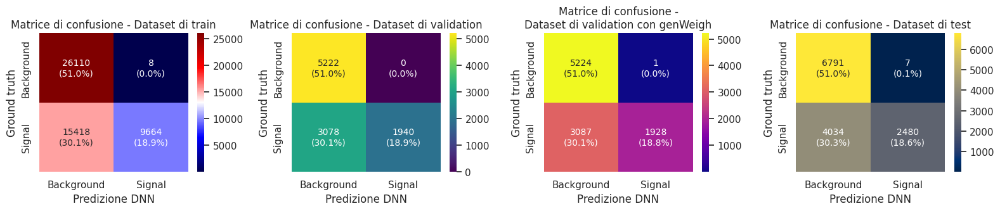

In [ ]:
# calcola le percentuali rispetto al totale per il dataset di train
total_train = cm_train.sum()
cm_train_percent_total = cm_train.astype('float')/total_train
cm_train_annot_total = np.array([["{0}\n({1:.1%})".format(count, percent) for count, percent in zip(row_counts, row_percent)] for row_counts, row_percent in zip(cm_train, cm_train_percent_total)])

# calcola le percentuali rispetto al totale per il dataset di validation
total_vali = cm_vali.sum()
cm_vali_percent_total = cm_vali.astype('float')/total_vali
cm_vali_annot_total = np.array([["{0}\n({1:.1%})".format(count, percent) for count, percent in zip(row_counts, row_percent)] for row_counts, row_percent in zip(cm_vali, cm_vali_percent_total)])

# calcola le percentuali rispetto al totale per il dataset di validation con genWeight
total_vali_weighted = cm_vali_weighted.sum()
cm_vali_weighted_percent_total = cm_vali_weighted.astype('float')/total_vali_weighted
cm_vali_weighted_annot_total = np.array([["{0}\n({1:.1%})".format(count, percent) for count, percent in zip(row_counts, row_percent)] for row_counts, row_percent in zip(cm_vali_weighted, cm_vali_weighted_percent_total)])

# calcola le percentuali rispetto al totale per il dataset di test
total_test = cm_test.sum()
cm_test_percent_total = cm_test.astype('float')/total_test
cm_test_annot_total = np.array([["{0}\n({1:.1%})".format(count, percent) for count, percent in zip(row_counts, row_percent)] for row_counts, row_percent in zip(cm_test, cm_test_percent_total)])

# crea una figura con quattro subplots affiancati
fig, axes = plt.subplots(1, 4, figsize=(16, 3.5))

x_labels = ['Background', 'Signal']
y_labels = ['Background', 'Signal']

# heatmap per dataset di train
sns.heatmap(cm_train, annot=cm_train_annot_total, fmt='', cmap='seismic', cbar=True, annot_kws={"size": 10}, xticklabels=x_labels, yticklabels=y_labels, ax=axes[0])
axes[0].set_title('Matrice di confusione - Dataset di train')
axes[0].set_xlabel('Predizione DNN')
axes[0].set_ylabel('Ground truth')

# heatmap per dataset di validation
sns.heatmap(cm_vali, annot=cm_vali_annot_total, fmt='', cmap='viridis', cbar=True, annot_kws={"size": 10}, xticklabels=x_labels, yticklabels=y_labels, ax=axes[1])
axes[1].set_title('Matrice di confusione - Dataset di validation')
axes[1].set_xlabel('Predizione DNN')
axes[1].set_ylabel('Ground truth')

# heatmap per dataset di validation con genWeight
sns.heatmap(cm_vali_weighted, annot=cm_vali_weighted_annot_total, fmt='', cmap='plasma', cbar=True, annot_kws={"size": 10}, xticklabels=x_labels, yticklabels=y_labels, ax=axes[2])
axes[2].set_title('Matrice di confusione -\nDataset di validation con genWeigh')
axes[2].set_xlabel('Predizione DNN')
axes[2].set_ylabel('Ground truth')

# heatmap per dataset di test
sns.heatmap(cm_test, annot=cm_test_annot_total, fmt='', cmap='cividis', cbar=True, annot_kws={"size": 10}, xticklabels=x_labels, yticklabels=y_labels, ax=axes[3])
axes[3].set_title('Matrice di confusione - Dataset di test')
axes[3].set_xlabel('Predizione DNN')
axes[3].set_ylabel('Ground truth')

plt.tight_layout()
plt.show()

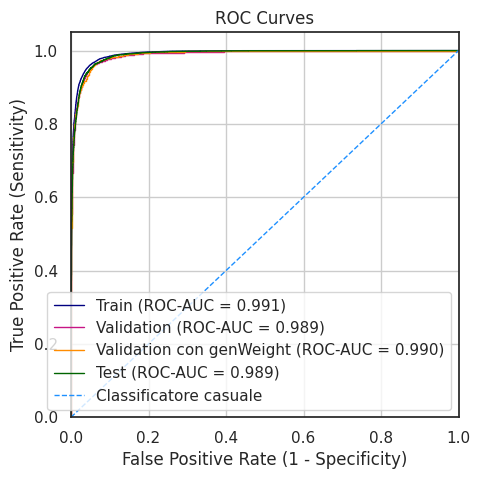

In [ ]:
# Lista dei dataset per ciclarli
datasets = [("Train", fpr_train, tpr_train, roc_auc_train), ("Validation", fpr_vali, tpr_vali, roc_auc_vali), ("Validation con genWeight", fpr_vali_weighted, tpr_vali_weighted, roc_auc_vali_weighted), ("Test", fpr_test, tpr_test, roc_auc_test)]
colors = ["navy", "mediumvioletred", "darkorange", "darkgreen"]

plt.figure(figsize=(5, 5))

count = 0
for label, fpr, tpr, roc_auc in datasets:
    plt.plot(fpr, tpr, linewidth=1, label=f'{label} (ROC-AUC = {roc_auc:.3f})', color = colors[count])
    count += 1

# Linea diagonale casuale
plt.plot([0, 1], [0, 1], color='dodgerblue', linewidth=1, linestyle='--', label = "Classificatore casuale")

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

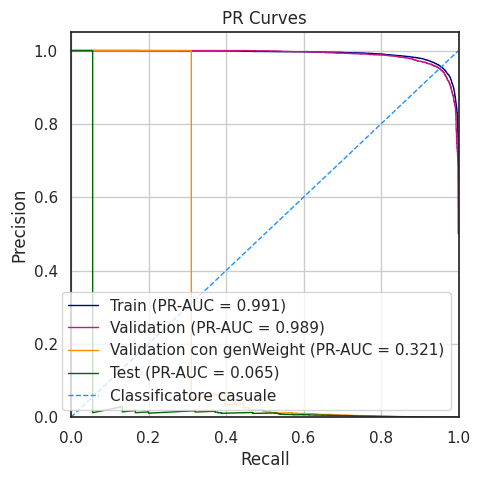

In [ ]:
# Lista dei dataset per ciclarli
datasets = [("Train", recall_train, precision_train, pr_auc_train), ("Validation", recall_vali, precision_vali, pr_auc_vali), ("Validation con genWeight", recall_vali_weighted, precision_vali_weighted, pr_auc_vali_weighted), ("Test", recall_test, precision_test, pr_auc_test)]
colors = ["navy", "mediumvioletred", "darkorange", "darkgreen"]

plt.figure(figsize=(5, 5))

count = 0
for label, recall, precision, pr_auc in datasets:
    plt.plot(recall, precision, linewidth=1, label=f'{label} (PR-AUC = {pr_auc:.3f})', color = colors[count])
    count += 1

# Linea diagonale casuale
plt.plot([0, 1], [0, 1], color='dodgerblue', linewidth=1, linestyle='--', label = "Classificatore casuale")

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
sample_size = 1000 # Puoi cambiare questo valore
sample_indices = np.random.choice(len(X_train), sample_size, replace=False)
X_train_sampled = X_train[sample_indices]

# Sposta tutto il modello sulla CPU
dnn = dnn.to('cpu')

# Define the prediction function
def predict_fn(x):
    # Ensure the input 'x' is a PyTorch tensor, even if it comes from a NumPy array
    if isinstance(x, np.ndarray):
        x = torch.from_numpy(x).float()

    # Run the model, handle the output shape, and return a NumPy array
    return dnn(x).detach().cpu().squeeze().numpy()

# Define the masker for the explainer using a NumPy array
masker = shap.maskers.Independent(X_train_sampled.cpu().numpy())

# Create the explainer by passing the prediction function and the masker
explainer = shap.Explainer(predict_fn, masker)

# Now, compute the SHAP values, ensuring you pass a NumPy array
X_train_np = X_train_sampled.detach().cpu().numpy()
shap_values = explainer(X_train_np)

PermutationExplainer explainer: 1001it [02:40,  5.94it/s]


/tmp/ipython-input-3024691606.py:1: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



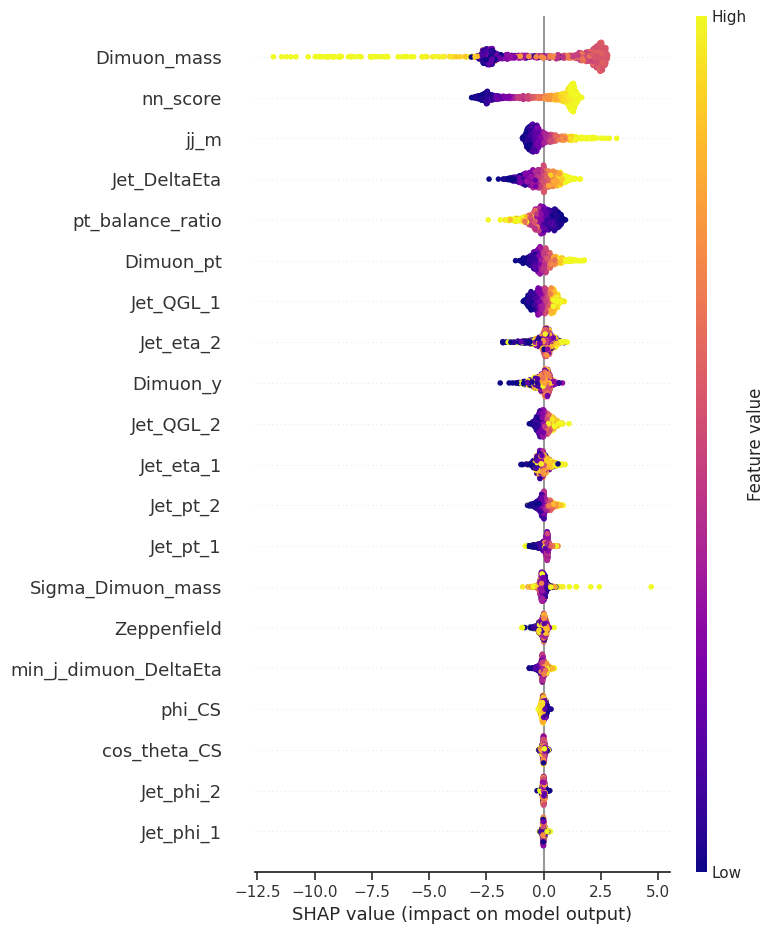

In [ ]:
shap.summary_plot(shap_values, X_train_sampled.detach().cpu().numpy(), feature_names=sel_features, cmap = "plasma")